# Resume Insights and Optimization

## 1. Data Insights

### Importing the libraries

The necessary libraries for data ingestion, data processing and data visualization have been installed and imported. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import math
from collections import Counter
from nltk.corpus import stopwords
from wordcloud import WordCloud
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report
from sklearn.decomposition import PCA
from plotly import express as px

### Dataset 1

* Dataset 1 is loaded from the kaggele dataset https://www.kaggle.com/datasets/avishekmajhi/resume-dataset
* The file consists of two columns Category and Resume.
* There are 8234 resumes in the current dataset.
* The shape of the dataset is 16468


In [2]:
#Read the csv file
df1 = pd.read_csv('final_merged_dataset2.csv')

#Interchanging the columns for maintaining the same format for all datasets
df1 = df1[['Category','Resume']]

#Display top 5 rows of the dataframe
df1.head()

,Category,Resume
0,Python_Developer,Python Developer Python Developer Philadelphia...
1,Python_Developer,Python Developer Python Developer Python Devel...
2,Python_Developer,R&D Engineer R&D Engineer R&D Engineer - Nokia...
3,Python_Developer,Sr. Full Stack Developer Sr. Full Stack Develo...
4,Python_Developer,Sr. Full Stack Python Developer Sr. Full Stack...


In [3]:
print("The shape of the Dataset1 : ", df1.shape)
print("The shape of the Dataset1 : ", df1.size)

The shape of the Dataset1 :  (8234, 2)
The shape of the Dataset1 :  16468


### Dataset 2

* Dataset 2 is loaded from the kaggele dataset https://www.kaggle.com/datasets/jillanisofttech/updated-resume-dataset
* The file consists of two columns Category and Resume.
* There are 962 resumes in the current dataset.
* The shape of the dataset is 1924


In [4]:
#Read the csv file
df2 = pd.read_csv('UpdatedResumeDataSet.csv')

#Display top 5 rows of the dataframe
df2.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [5]:
print("The shape of the Dataset2 : ", df2.shape)
print("The shape of the Dataset2 : ", df2.size)

The shape of the Dataset2 :  (962, 2)
The shape of the Dataset2 :  1924


### Dataset 3

* Dataset 3 is loaded from the kaggele dataset https://www.kaggle.com/datasets/jithinjagadeesh/resume-dataset
* The file consists of two columns Category and Resume.
* There are 400 resumes in the current dataset.
* The shape of the dataset is 800


In [6]:
#Read the csv file
df3 = pd.read_csv('gpt_dataset.csv')

#Display top 5 rows of the dataframe
df3.head()

,Category,Resume
0,Frontend Developer,"As a seasoned Frontend Developer, I have a pro..."
1,Backend Developer,With a solid background in Backend Development...
2,Python Developer,"As a Python Developer, I leverage my expertise..."
3,Data Scientist,"With a background in Data Science, I possess a..."
4,Frontend Developer,Experienced Frontend Developer with a passion ...


In [7]:
print("The shape of the Dataset3 : ", df3.shape)
print("The shape of the Dataset3 : ", df3.size)

The shape of the Dataset3 :  (400, 2)
The shape of the Dataset3 :  800


### Dataset 4

* Dataset 4 is loaded from the kaggele dataset https://www.kaggle.com/datasets/snehaanbhawal/resume-dataset
* The file consists of two columns Category and Resume.
* There are 400 resumes in the current dataset.
* The shape of the dataset is 800


In [8]:
#Read the csv file
df4 = pd.read_csv('Resume.csv')

#Drop the "ID" and "Resume_html" columns and modify the dataset
#To ensure there are same columns in all datasets.
df4.drop(['ID', 'Resume_html'], axis=1, inplace=True)

#Rename the column "Resume_str" to "Resume"
df4.rename(columns = {'Resume_str':'Resume'}, inplace=True)

#Interchange the columns "Resume" and "Category"
df4 = df4[['Category','Resume']]

#Display top 5 rows of the dataframe
df4.head()

,Category,Resume
0,HR,HR ADMINISTRATOR/MARKETING ASSOCIATE\...
1,HR,"HR SPECIALIST, US HR OPERATIONS ..."
2,HR,HR DIRECTOR Summary Over 2...
3,HR,HR SPECIALIST Summary Dedica...
4,HR,HR MANAGER Skill Highlights ...


In [9]:
print("The shape of the Dataset4 : ", df4.shape)
print("The shape of the Dataset4 : ", df4.size)

The shape of the Dataset4 :  (2484, 2)
The shape of the Dataset4 :  4968


## 2. Exploratory Data Analysis

### 1. Merge Datasets

All the four datasets are concatenated using **concat** function from pandas which appends the data to one another without intervening the original dataset.

In [10]:
#Concatenate the dataframes into a single dataframe
df = pd.concat([df1, df2, df3, df4], axis = 0)

#Display top 5 rows of the dataframe
df.head()

,Category,Resume
0,Python_Developer,Python Developer Python Developer Philadelphia...
1,Python_Developer,Python Developer Python Developer Python Devel...
2,Python_Developer,R&D Engineer R&D Engineer R&D Engineer - Nokia...
3,Python_Developer,Sr. Full Stack Developer Sr. Full Stack Develo...
4,Python_Developer,Sr. Full Stack Python Developer Sr. Full Stack...


In [11]:
print("The shape of the final Dataset : ", df.shape)
print("The shape of the final Dataset : ", df.size)

The shape of the final Dataset :  (12080, 2)
The shape of the final Dataset :  24160


### 2. Handling Duplicates

* Checking for the duplicates in the entire dataset. 
* If any, the dataset is made free of redundant values using the below method.

In [12]:
#Check for duplicates
if df.duplicated().sum()!=0:
    print("Yes, there are duplicated rows in the dataset.")
    print("The number of duplicated rows are : ", df.duplicated().sum())
    df = df.drop_duplicates()
else:
    print("There are no duplicated rows in the dataset.")

Yes, there are duplicated rows in the dataset.
The number of duplicated rows are :  1077


### 3. Handling NULL values

* Checking if there are any NULL or missing values present in the dataset.
* If there are any they can be dropped or imputed for ensuring the integrity of the dataset.

In [13]:
#Check for NULL values
if df.isna().sum().sum() == 0:
    print("There are no null values in the dataset that need to be addressed")
else:
    print("There are missing or null values in the dataset that need to be addressed")


There are no null values in the dataset that need to be addressed


### 3. Identifying the unique categories

* The total number of categories present in the dataset are **65**. 
* The respective categories are displayed below. 

In [14]:
unique_categories = df['Category'].unique()
print("The number of categories present in the dataset:", len(unique_categories))
print("The categories present in the dataset:\n", unique_categories)

The number of categories present in the dataset: 65
The categories present in the dataset:
 ['Python_Developer' 'Java_Developer' 'Front_End_Developer'
 'Network_Administrator' 'Project_manager' 'Security_Analyst'
 'Software_Developer' 'Systems_Administrator' 'Web_Developer'
 'Database_Administrator' 'Data Science' 'HR' 'Advocate' 'Arts'
 'Web Designing' 'Mechanical Engineer' 'Sales' 'Health and fitness'
 'Civil Engineer' 'Java Developer' 'Business Analyst' 'SAP Developer'
 'Automation Testing' 'Electrical Engineering' 'Operations Manager'
 'Python Developer' 'DevOps Engineer' 'Network Security Engineer' 'PMO'
 'Database' 'Hadoop' 'ETL Developer' 'DotNet Developer' 'Blockchain'
 'Testing' 'Frontend Developer' 'Backend Developer' 'Data Scientist'
 'Full Stack Developer' 'Mobile App Developer (iOS/Android)'
 'Machine Learning Engineer' 'Cloud Engineer' 'DESIGNER'
 'INFORMATION-TECHNOLOGY' 'TEACHER' 'ADVOCATE' 'BUSINESS-DEVELOPMENT'
 'HEALTHCARE' 'FITNESS' 'AGRICULTURE' 'BPO' 'SALES' 'CONS

In [15]:
df['Category'].value_counts()

Category
Python_Developer             1278
Java_Developer               1206
Web_Developer                 968
Database_Administrator        920
Security_Analyst              875
                             ... 
Network Security Engineer       5
Electrical Engineering          5
Web Designing                   4
Operations Manager              4
PMO                             3
Name: count, Length: 65, dtype: int64

1. Categories like **Python_Developer** and **Python Developer** are same and the respective resumes falls under the same category. 
2. This is handled by identifying such categories in the data and is handled using category mapping function where it replaces the columns and gives the unique number of categories.

In [16]:
category_mapping = {
    'Python_Developer': 'Python Developer',
    'Java_Developer': 'Java Developer',
    'Web_Developer': 'Web Developer',
    'Front_End_Developer': 'Front End Developer',
    'Security_Analyst': 'Network Security Engineer',
    'Frontend Developer':'Front End Developer',
    'Network Security Engineer':'Network Security Engineer',
    'FITNESS':'Health and fitness',
    'Data Scientist':'Data Science',
    'SALES':'Sales',
    'ARTS':'Arts',
    'ADVOCATE':'Advocate',
    'Web Designing':'Web Developer'
    
}

In [17]:
df['Category'] = df['Category'].replace(category_mapping)

The number of unique categories present after handling the redundant values are **55**.

In [18]:
print(f"Number of unique categories: {len(df['Category'].unique())} \nCategories:\n {df['Category'].unique()}")

Number of unique categories: 55 
Categories:
 ['Python Developer' 'Java Developer' 'Front End Developer'
 'Network_Administrator' 'Project_manager' 'Network Security Engineer'
 'Software_Developer' 'Systems_Administrator' 'Web Developer'
 'Database_Administrator' 'Data Science' 'HR' 'Advocate' 'Arts'
 'Mechanical Engineer' 'Sales' 'Health and fitness' 'Civil Engineer'
 'Business Analyst' 'SAP Developer' 'Automation Testing'
 'Electrical Engineering' 'Operations Manager' 'DevOps Engineer' 'PMO'
 'Database' 'Hadoop' 'ETL Developer' 'DotNet Developer' 'Blockchain'
 'Testing' 'Backend Developer' 'Full Stack Developer'
 'Mobile App Developer (iOS/Android)' 'Machine Learning Engineer'
 'Cloud Engineer' 'DESIGNER' 'INFORMATION-TECHNOLOGY' 'TEACHER'
 'BUSINESS-DEVELOPMENT' 'HEALTHCARE' 'AGRICULTURE' 'BPO' 'CONSULTANT'
 'DIGITAL-MEDIA' 'AUTOMOBILE' 'CHEF' 'FINANCE' 'APPAREL' 'ENGINEERING'
 'ACCOUNTANT' 'CONSTRUCTION' 'PUBLIC-RELATIONS' 'BANKING' 'AVIATION']


### 4. Summary of Dataset

* Retrieving information about the entire dataset. 
* The name, type and the number of columns and rows present in the dataframe are obtained.

In [19]:
#Information regarding the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11003 entries, 0 to 2482
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  11003 non-null  object
 1   Resume    11003 non-null  object
dtypes: object(2)
memory usage: 257.9+ KB


### 5. Statistics of the Dataset

* Statistics of the dataframe is obtained. 
* It gives the count of the rows and columns present in the dataset along with the most frequent attribute with it's frequency. 

In [20]:
#Retrieve the statistics of the dataset
df.describe(include='all')

,Category,Resume
count,11003,11003
unique,55,11003
top,Python Developer,Python Developer Python Developer Philadelphia...
freq,1306,1


#### Frequency distribution of the categories

#### Bar Graph Representation

In [21]:
# Group by the 'Category' column and count occurrences
counts_category = df.groupby('Category').size().reset_index(name='Count').sort_values(by='Count', ascending=False)

bar_fig = px.bar(
    counts_category,# The dataframe to be plotted
    y="Category",  # y-axis with unique categories
    x="Count",  # x-axis with count of occurrences
    color="Category",  # Use 'Category' for color differentiation
    text="Count",  # Display count values as text labels
    orientation="h",  # Horizontal bar chart
    height=1000,  # Height of the figure
    title="Frequency Distribution of Categories"
)

# Display the Bar Graph
bar_fig.show()

#### Pie Chart representation

In [22]:
# Create a pie chart using Plotly Express
pie_fig = px.pie(
    counts_category,  # The DataFrame containing the data to be plotted
    names="Category",  # Column name in the DataFrame to be used for labeling each pie segment
    values="Count",    # Column name in the DataFrame to be used for determining the size of each segment
    height=1000,       # Set the height of the pie chart to 1000 pixels
    title="Frequency Distribution of Categories"  # Set the title of the pie chart
)

# Display the pie chart
pie_fig.show()


#### Cleaning the resume
The **Resume** column of the dataset contains the resume of each individual. It is of the form plain text which contains information of the individual like education, skills, work experience, websites etc. This will include a lot of unnecessary words or chars which are not useful for model training. These are handled using the below **clean_resume** function. It removes the following:
* It removes the URLS present in the resume.
* The mails, carbon copies or any retweets if there are any are removed.
* Mentions or hashtags are handled.
* Special characters and non-ASCII characters are removed from the data.
* Plain text contains multiple white spaces and new lines which are also handled as part of this function

In [23]:
#Defining the cleanResume for cleaning the plain text
def clean_resume(res):
    
    # Remove URLs
    cleanResume = re.sub(r'http\S+|www\S+|https\S+', '', res, flags=re.MULTILINE)

    # Remove retweets and carbon copies (RT and CC)
    cleanResume = re.sub(r'\bRT\b|\bCC\b', '', cleanResume)

    # Remove hashtags and @ mentions
    cleanResume = re.sub(r'@\S+|#\S+', '', cleanResume)

    # Remove special characters except spaces
    cleanResume = re.sub(r'[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', cleanResume)

    # Remove non-ASCII characters
    cleanResume = re.sub(r'[^\x00-\x7f]', ' ', cleanResume)

    # Remove extra whitespaces and newline characters
    cleanResume = re.sub('\s+', ' ', cleanResume).strip()

    # Remove non-alphanumeric characters except spaces
    cleanResume = re.sub('[^A-Za-z0-9\s]', '', cleanResume)

    # Remove multiple consecutive spaces
    cleanResume = re.sub(' +', ' ', cleanResume)

    return cleanResume


In [24]:
# Apply the 'clean_resume' function to each entry in the 'Resume' column of the DataFrame
df['Resume'] = df['Resume'].apply(lambda x: clean_resume(x))

In [25]:
df['Resume'][0]

0    Python Developer Python Developer Philadelphia...
0    Skills Programming Languages Python pandas num...
0    As a seasoned Frontend Developer I have a prov...
0    HR ADMINISTRATOR MARKETING ASSOCIATE HR ADMINI...
Name: Resume, dtype: object

#### Most frequent words of dataset along with categories

* The most used words in all of the resumes are retrieved using the below function. 

* The common english words like **the**, **a**, **is** etc are stopped, only the meaningful words are extracted from the text and are saved to a list along with the frequency of each word. 

* This is helpful in extracting the skills that are desired for each role and also helps the individual if they are lacking anywhere.

In [26]:
#This function finds the most frequent words in a list of resumes.
def get_most_frequent_words(resumes, num_words=10, common_words=None):

    # Get a set of common English stopwords from the NLTK library
    stop_words = set(stopwords.words('english'))
    
    # If there are additional common words to exclude, add them to the stopwords set
    if common_words is not None:
        stop_words.update(common_words)
    
    # Combine all resumes into a single string and split into individual words
    all_words = ' '.join(resumes).split()
    
    # Filter out stopwords from the list of words
    filtered_words = [word for word in all_words if word.lower() not in stop_words]
    
    # Count the frequency of each word in the filtered list
    word_freq = Counter(filtered_words)
    
    # Get the most common words and their counts as a list of tuples
    most_common_words = word_freq.most_common(num_words)
    
    return most_common_words


In [27]:
# Get the most frequent 50 words from the 'Resume' column of the DataFrame
most_freq_words = get_most_frequent_words(df['Resume'], num_words=50)

# Extract only the words from the list of (word, count) tuples
most_freq_words_category = [item[0] for item in most_freq_words]

# Print a header for the output
print("Most Common Words: Occurrence")

# Print the list of most common words along with their counts
print(most_freq_words)


Most Common Words: Occurrence
[('using', 109001), ('data', 58342), ('Python', 42760), ('SQL', 39462), ('application', 38610), ('Developed', 35537), ('Used', 34235), ('web', 33868), ('Web', 33698), ('development', 33133), ('Experience', 30915), ('database', 30124), ('Developer', 28740), ('years', 28691), ('JavaScript', 28278), ('Java', 26730), ('Worked', 26087), ('management', 25717), ('applications', 25003), ('CSS', 24417), ('HTML', 23876), ('like', 22994), ('project', 22860), ('team', 22762), ('experience', 22500), ('system', 22157), ('business', 22122), ('services', 22008), ('Oracle', 21910), ('design', 21780), ('various', 21109), ('new', 21022), ('based', 21003), ('Server', 20840), ('Spring', 20119), ('testing', 19762), ('support', 19248), ('Management', 19219), ('Created', 18655), ('Django', 18176), ('2', 18127), ('Involved', 18036), ('State', 17577), ('user', 17468), ('end', 17260), ('Data', 17119), ('XML', 16736), ('City', 16442), ('security', 16359), ('including', 16339)]


In [28]:
print("Most Common Words:")
print(most_freq_words_category)

Most Common Words:
['using', 'data', 'Python', 'SQL', 'application', 'Developed', 'Used', 'web', 'Web', 'development', 'Experience', 'database', 'Developer', 'years', 'JavaScript', 'Java', 'Worked', 'management', 'applications', 'CSS', 'HTML', 'like', 'project', 'team', 'experience', 'system', 'business', 'services', 'Oracle', 'design', 'various', 'new', 'based', 'Server', 'Spring', 'testing', 'support', 'Management', 'Created', 'Django', '2', 'Involved', 'State', 'user', 'end', 'Data', 'XML', 'City', 'security', 'including']


#### Visual representation of common words using WordCloud

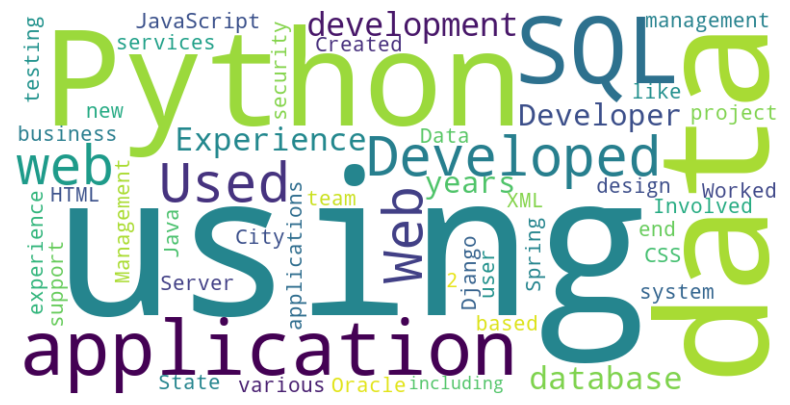

In [29]:
# Create a word cloud visualization using the most common words and their frequencies
wordcloud = WordCloud(
    width=800,                    # Set the width of the word cloud image
    height=400,                   # Set the height of the word cloud image
    background_color='white'      # Set the background color of the word cloud to white
).generate_from_frequencies(
    dict(most_freq_words)       # Convert the list of most common words into a dictionary of {word: frequency} pairs
)

# Set up the plot figure with a specific size
plt.figure(figsize=(10, 5))

# Display the word cloud image using matplotlib
plt.imshow(wordcloud, interpolation='bilinear')

# Remove the axis for a cleaner visualization
plt.axis('off')

# Display the word cloud plot
plt.show()

In [30]:
# Sort the DataFrame 'df' based on the 'Category' column
df_sorted = df.sort_values(by='Category')

# Group the sorted DataFrame by the 'Category' column
# For each category, join all cleaned resumes into a single string
grouped_resumes = df_sorted.groupby('Category')['Resume'].apply(
    lambda x: ' '.join(x)  # Join all resumes in each category into a single string, separated by a space
).reset_index()


#### WordCloud for each category

Each of the category is taken from the dataframe and the most frequent words each of them is displayed using wordCloud. 

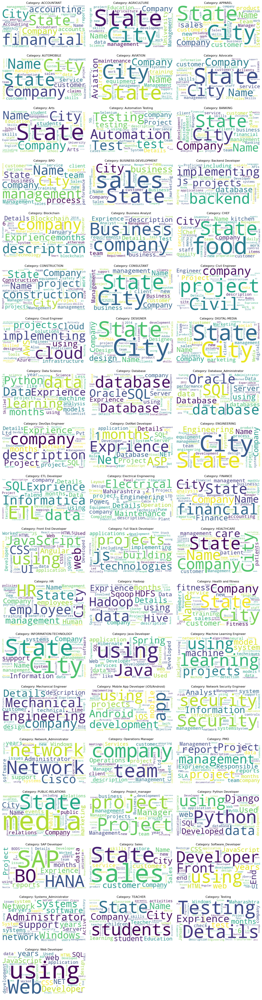

In [31]:
# Assume grouped_resumes and get_most_frequent_words are already defined

num_categories = len(grouped_resumes)
num_cols = 3  # You can change the number of columns based on your preference
num_rows = math.ceil(num_categories / num_cols)  # Ceiling division to calculate the number of rows

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Generate word clouds for each category and plot in subplots
for index, (idx, row) in enumerate(grouped_resumes.iterrows()):
    category_resumes = row['Resume']
    category = row['Category']

    # Get most common words for the category
    most_common_words = get_most_frequent_words([category_resumes], num_words=50, common_words=['State', 'Company', 'City', 'Name', 'Company'])

    # Create word cloud
    wordcloud = WordCloud(width=400, height=200, background_color='white').generate_from_frequencies(dict(most_common_words))

    # Plot word cloud in the corresponding subplot
    ax = axes[index]
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.set_title(f'Category: {category}')
    ax.axis('off')

# Hide any unused subplots
for i in range(index + 1, len(axes)):
    axes[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


#### Handling categorical values

* The target variable is the **Category** column which contains several categories like Jave Developer, Testing, Software Developer, HR, Advocate etc. like 62 unique categories.

* Each of the catgeory to mapped or predicted by the model it has to be converted to numerical values for which **LabelEncoder** method is used. Each category is assigned with a unique category label and is helpful while predicting the category when given it to a model for processing the resume. 

* Since, the dataset contains multiple catgeories in the target variable. It makes the data as a multiclass target variable and it has to be handled or modelled using multiclassifier models.

In [32]:
# Initialize a LabelEncoder object from scikit-learn
le = LabelEncoder()

# Fit the LabelEncoder to the 'Category' column in the DataFrame
le.fit(df['Category'])

# Transform the categorical values in the 'Category' column into numerical labels
df['Category_labels'] = le.transform(df['Category'])


In [33]:
# Create a mapping from encoded labels to category names
label_to_category = dict(zip(df['Category_labels'], df['Category']))

# Print the mapping
print("Label to Category Mapping:")
print(label_to_category)

Label to Category Mapping:
{47: 'Python Developer', 37: 'Java Developer', 30: 'Front End Developer', 42: 'Network_Administrator', 46: 'Project_manager', 41: 'Network Security Engineer', 50: 'Software_Developer', 51: 'Systems_Administrator', 54: 'Web Developer', 23: 'Database_Administrator', 21: 'Data Science', 33: 'HR', 5: 'Advocate', 6: 'Arts', 39: 'Mechanical Engineer', 49: 'Sales', 35: 'Health and fitness', 17: 'Civil Engineer', 13: 'Business Analyst', 48: 'SAP Developer', 7: 'Automation Testing', 28: 'Electrical Engineering', 43: 'Operations Manager', 24: 'DevOps Engineer', 44: 'PMO', 22: 'Database', 34: 'Hadoop', 27: 'ETL Developer', 25: 'DotNet Developer', 12: 'Blockchain', 53: 'Testing', 11: 'Backend Developer', 31: 'Full Stack Developer', 40: 'Mobile App Developer (iOS/Android)', 38: 'Machine Learning Engineer', 18: 'Cloud Engineer', 19: 'DESIGNER', 36: 'INFORMATION-TECHNOLOGY', 52: 'TEACHER', 10: 'BUSINESS-DEVELOPMENT', 32: 'HEALTHCARE', 1: 'AGRICULTURE', 9: 'BPO', 16: 'CONSUL

#### Categories with it's Labels

In [34]:
df[['Category', 'Category_labels']].drop_duplicates()

,Category,Category_labels
0,Python Developer,47
1278,Java Developer,37
2520,Front End Developer,30
3050,Network_Administrator,42
3519,Project_manager,46
4241,Network Security Engineer,41
5117,Software_Developer,50
5554,Systems_Administrator,51
6330,Web Developer,54
7314,Database_Administrator,23


#### Vectorization

* Resume containing plain text has many stop words like **a**, **the**, **is** etc, all these words need to be filtered out.

* While vectorizing the resume content. Each of the key word from the resume is extracted and is assigned a token number.

* This helps the machine whenever it encounters the same word in any of the other resumes, the token number associated to the word is taken is helpful while processing the data. 

In [35]:
# Initialize a TfidfVectorizer with English stopwords removed
tfidf = TfidfVectorizer(stop_words='english')

# Fit the TfidfVectorizer on the 'Resume' column of the DataFrame
tfidf.fit(df['Resume'])

# Transform the 'Resume' column into a TF-IDF matrix
requiredText = tfidf.transform(df['Resume'])

* After vectorization, the data in the matrix is very huge and the sparse matrix contains data of about 11003 rows and 85373 columns where each vectorized. 
* It also contains 3919272 elements in the compressed format which allows the system to occupy the space efficiently.

In [36]:
requiredText

<11003x85373 sparse matrix of type '<class 'numpy.float64'>'
	with 3919272 stored elements in Compressed Sparse Row format>

In [37]:
print("The shape of the sparse matrix:", requiredText.shape)

The shape of the sparse matrix: (11003, 85373)


### Model Development

### Splitting the dataset

The complete dataset is splitted into training and testing datasets. 

80% of the dataset is considered as training dataset and the remaining 20% is considered as testing dataset.

The stratify parameter in the train_test_split function ensures that the proportion of classes (or categories) in the training and testing sets is the same as in the original dataset which preventing bias or skew in your training and evaluation phases.

* The X_train contains contains 8802 rows and 85373 columns.
* The y_train consists of 8802 rows.
* The X_test consists of 2201 rows and 85373 columns.
* The y_test consists of 2201 rows.

 

In [38]:
X_train, X_test, y_train, y_test = train_test_split(requiredText, df['Category_labels'], test_size=0.2, random_state=42, stratify=df['Category_labels'])

In [39]:
print(f"Shape X_Train: {X_train.shape}\nShape of X_test: {X_test.shape}\nShape of y_train: {y_train.shape}\nShape of y_test: {y_test.shape}")

Shape X_Train: (8802, 85373)
Shape of X_test: (2201, 85373)
Shape of y_train: (8802,)
Shape of y_test: (2201,)


#### 1. Logistic Regression

In [40]:
#Model Initiliaziation
clf_lr = OneVsRestClassifier(LogisticRegression(max_iter=1000))  # Adjust max_iter if needed

#Fitting the model on training dataset
clf_lr.fit(X_train, y_train)

#Predicting the category based on the model
ypred_lr = clf_lr.predict(X_test)
print("The accuracy obtained by Logistic Regression is:",accuracy_score(y_test,ypred_lr))

The accuracy obtained by Logistic Regression is: 0.82189913675602


#### 2. Support Vectore Machine Classifier

In [41]:
#Model Initiliaziation
clf_svm_rbf = OneVsRestClassifier(SVC(kernel='rbf',probability=True, random_state=42))  # 'rbf' 

#Fitting the model on training dataset
clf_svm_rbf.fit(X_train, y_train)

#Predicting the category based on the model
ypred_svm_rbf = clf_svm_rbf.predict(X_test)
print("The accuracy obtained by SVC with rbf is:",accuracy_score(y_test,ypred_svm_rbf))

The accuracy obtained by SVC with rbf is: 0.8468877782825989


In [43]:
#Model Initiliaziation
clf_svm_lr = OneVsRestClassifier(SVC(kernel='linear',probability=True, random_state=42))  # 'rbf' 

#Fitting the model on training dataset
clf_svm_lr.fit(X_train, y_train)

#Predicting the category based on the model
ypred_svm_lr = clf_svm_lr.predict(X_test)
print("The accuracy obtained by SVC with lr is:",accuracy_score(y_test,ypred_svm_lr))

The accuracy obtained by SVC with lr is: 0.8441617446615175


#### 3. Naive Bayes

In [44]:
from sklearn.naive_bayes import MultinomialNB

#Model Initiliaziation
clf_nb = OneVsRestClassifier(MultinomialNB())   

#Fitting the model on training dataset
clf_nb.fit(X_train, y_train)

#Predicting the category based on the model
ypred = clf_nb.predict(X_test)
print("The accuracy obtained by Naive Bayes is:",accuracy_score(y_test,ypred))

The accuracy obtained by Naive Bayes is: 0.567014993184916


#### 4. Random Forest Classifier

In [45]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

clf_rf = OneVsRestClassifier(RandomForestClassifier(
    n_estimators=50,        # Reduced number of trees
    random_state = 42))

clf_rf.fit(X_train, y_train)
ypred = clf_rf.predict(X_test)
print("The accuracy obtained by RF classifier is:",accuracy_score(y_test,ypred))

The accuracy obtained by RF classifier is: 0.7601090413448433


#### 5. Desicion Tree Classifier

In [46]:
clf_dt = OneVsRestClassifier(DecisionTreeClassifier(
        # Reduced number of trees
    random_state = 42))

clf_dt.fit(X_train, y_train)
ypred = clf_dt.predict(X_test)
print("The accuracy obtained by DT classifier is:",accuracy_score(y_test,ypred))

The accuracy obtained by DT classifier is: 0.7105860972285325


In [49]:
#Predicting the category based on the model
print("The Classification Report:")
print(classification_report(y_test, ypred_svm_rbf, target_names=label_to_category.values(),zero_division=0))

The Classification Report:
                                    precision    recall  f1-score   support

                  Python Developer       0.75      0.88      0.81        24
                    Java Developer       0.62      0.38      0.48        13
               Front End Developer       0.57      0.63      0.60        19
             Network_Administrator       0.33      0.14      0.20         7
                   Project_manager       0.83      0.87      0.85        23
         Network Security Engineer       0.70      0.62      0.65        26
                Software_Developer       0.83      0.23      0.36        22
             Systems_Administrator       0.00      0.00      0.00         1
                     Web Developer       0.76      0.70      0.73        23
            Database_Administrator       0.00      0.00      0.00         4
                      Data Science       0.73      0.67      0.70        24
                                HR       1.00      1.00     

### Accuracies

In [50]:
import plotly.graph_objects as go

# Assuming you have a list of models and their corresponding predictions
models = ["SVM Linear","SVM RBF", "Random Forest", "Logistic Regression", "Multinomial NB", "Desicion Tree"]  
model_predictions = {
    "SVM Linear": clf_svm_lr.predict(X_test),
    "SVM RBF": clf_svm_rbf.predict(X_test),
    "Random Forest": clf_rf.predict(X_test),
    "Logistic Regression": clf_lr.predict(X_test),
    "Multinomial NB": clf_nb.predict(X_test),
    "Desicion Tree": clf_dt.predict(X_test)
}

# Calculate accuracies for each model
accuracies = {model: accuracy_score(y_test, predictions) for model, predictions in model_predictions.items()}

# Sort the accuracies in descending order
sorted_accuracies = dict(sorted(accuracies.items(), key=lambda item: item[1], reverse=True))

# Create an empty figure
fig = go.Figure()

# Number of models
num_models = len(models)

# Add a gauge chart for each model (sorted by accuracy)
for i, (model, accuracy) in enumerate(sorted_accuracies.items()):
    # Ensure the y_position stays within [0, 1]
    y_position_start = 1 - (i + 1) * (1 / num_models)
    y_position_end = y_position_start + (1 / num_models)

    # Add the gauge trace for the model
    fig.add_trace(go.Indicator(
        mode="gauge+number",
        value=accuracy,
        gauge={
            'axis': {'range': [None, 1]},
            'steps': [
                {'range': [0, 1], 'color': "lightgray"}
            ]
        },
        domain={'x': [0, 0.7], 'y': [y_position_start, y_position_end]}  # Adjust x to place gauges on the left
    ))
    
    # Add model name to the right of the gauge
    fig.add_annotation(
        x=0.85,  # Position the annotation to the right of the gauge
        y=(y_position_start + y_position_end) / 2,  # Center it vertically with the gauge
        text=model,
        showarrow=False,
        font={'size': 14, 'color': 'white'},
        align='left',
        bgcolor="rgba(0,0,0,0)"
    )

# Update layout to improve spacing, background color, and add padding
fig.update_layout(
    title="Model Accuracy Comparison",
    height=500 + (num_models * 100),  # Dynamic height based on number of models
    showlegend=False,  # Hide legend
    template="plotly_dark",  # Use dark theme for better contrast (optional)
    margin={"t": 50, "b": 50, "l": 50, "r": 50},  # Add padding around the chart
)

# Show the figure
fig.show()



### Confusion Matrix

In [52]:
from sklearn.metrics import confusion_matrix
import plotly.figure_factory as ff

# Generating confusion matrix
cm = confusion_matrix(y_test, ypred_svm_rbf)

# Define the class names
class_names = ['Python Developer', 'Java Developer', 'Front End Developer', 'Network_Administrator', 'Project_manager', 
 'Network Security Engineer', 'Software_Developer', 'Systems_Administrator', 'Web Developer', 'Database_Administrator', 
 'Data Science', 'HR', 'Advocate', 'Arts', 'Mechanical Engineer', 'Sales', 'Health and fitness', 'Civil Engineer', 
 'Business Analyst', 'SAP Developer', 'Automation Testing', 'Electrical Engineering', 'Operations Manager', 'DevOps Engineer', 
 'PMO', 'Database', 'Hadoop', 'ETL Developer', 'DotNet Developer', 'Blockchain', 'Testing', 'Backend Developer', 
 'Full Stack Developer', 'Mobile App Developer (iOS/Android)', 'Machine Learning Engineer', 'Cloud Engineer', 'DESIGNER', 
 'INFORMATION-TECHNOLOGY', 'TEACHER', 'BUSINESS-DEVELOPMENT', 'HEALTHCARE', 'AGRICULTURE', 'BPO', 'CONSULTANT', 
 'DIGITAL-MEDIA', 'AUTOMOBILE', 'CHEF', 'FINANCE', 'APPAREL', 'ENGINEERING', 'ACCOUNTANT', 'CONSTRUCTION', 
 'PUBLIC-RELATIONS', 'BANKING', 'AVIATION']

# Creating the confusion matrix heatmap
fig = ff.create_annotated_heatmap(
    z=cm,
    x=class_names, 
    y=class_names, 
    colorscale="Viridis"
)

# Update layout for better readability
fig.update_layout(
    title="<b>Confusion Matrix: True vs Predicted Labels</b>",
    xaxis_title="Predicted Labels",
    yaxis_title="True Labels",
    width=1000,  # Increase figure width
    height=1000,  # Increase figure height
    title_x=0.5,  # Center the title
    title_y=0.98  # Move title to the top
)

# Update font size and annotation size
fig.update_layout(
    font=dict(size=10),  # Adjust font size for axis labels and title
)

# Show the figure
fig.show()



In [53]:
# Create a DataFrame for True vs Predicted values
vals = pd.DataFrame({'True Values': y_test, 'Predicted Values': ypred_svm_rbf})

# Create the scatter plot
fig = px.scatter(vals, x='True Values', y='Predicted Values',
                 title="True vs Predicted Values: SVC with RBF Kernel",
                 labels={'True Values': 'True Labels', 'Predicted Values': 'Predicted Labels'})

# Add a line to show where predictions exactly match true values (y = x line)
fig.add_shape(
    type="line", x0=min(vals['True Values']), y0=min(vals['True Values']),
    x1=max(vals['True Values']), y1=max(vals['True Values']),
    line=dict(color="red", dash="dash"), name="Perfect Prediction Line"
)

fig.show()


### Pickling the Models

In [54]:
import pickle

pickle.dump(tfidf,open('tfidf.pkl','wb'))

models = {
    "Logistic_Regression": clf_lr,
    "SVM_Linear": clf_svm_lr,
    "SVM_RBF": clf_svm_rbf,
    "Naive_Bayes": clf_nb,
    "Random_Forest": clf_rf,
    "Decision_Tree": clf_dt
}

for name, model in models.items():
    with open(f"{name}.pkl", "wb") as file:
        pickle.dump(model, file)
    print(f"Saved {name} model to {name}.pkl")

# Load all models and preprocessing tools
model_files = {
    "Logistic Regression": "Logistic_Regression.pkl",
    "SVM (Linear)": "SVM_Linear.pkl",
    "SVM (RBF)": "SVM_RBF.pkl",
    "Naive Bayes": "Naive_Bayes.pkl",
    "Random Forest": "Random_Forest.pkl",
    "Decision Tree": "Decision_Tree.pkl"
}

# Load models
models = {}
for name, filename in model_files.items():
    with open(filename, "rb") as file:
        models[name] = pickle.load(file)


my_resume= """SREYA SREE SILOJU
667-406-7424 ||sreyasreesiloju1999@gmail.com
Baltimore, MD, 21227
http://www.linkedin.com/in/sreya-sree-siloju-a29224149 || https://github.com/sreya-sree/projects

Professional Summary

Engineer with 2.5+ years of experience in automotive domain including embedded systems with data science. Skilled in leveraging Python, SQL, CAPL and Power BI to develop advanced analytics solutions. Experienced in collaborating with global, cross-functional teams to optimize equipment performance and ensure data-driven decision-making in the automotive and industrial sectors.

Skills

Programming Languages: Python, SQL, CAPL,PySPark ETL Processes, AWS
Big Data & Databases: Apache Spark, Hadoop
Embedded Tools: Canoe, Canape, DSA
Data Visualization: Power BI, Tableau, Paginated Reports using PowerBI Report Builder
Machine Learning: Predictive Modeling, Neural Networks, TensorFlow, PyTorch
Other Skills: Cross-functional Collaboration, Global Team Navigation, Data Pipeline Development

Work Experience

Cash Generator                                                                                                                                                      UK, Remote 
Project Trainee                                                                                                                                                         Feb 2024 – Present
•	Processed and curated real-time transactional data from customers, ensuring data readiness for model training.
•	Leveraged Python and SQL for advanced data processing, achieving 95% data accuracy for predictive algorithms.
•	Stakeholder satisfaction is maintained by developing Power BI paginated reports for ensuring the progress of the work.
•	Conducted statistical analysis and designed experiments to validate models, improving decision-making processes across multiple business units.

ZF India Pvt. Ltd.	Hyderabad, India
Engineer	                                                                                                                                                                   Jul 2020 - Jan 2023
•	Analyzed over 750+ requirements across multiple product lines including Geely, PoleStar, and Volvo, covering critical components like Steering, Seatbelt, and eDrive, using Python, CAPL, and SQL.
•	Developed and tested 100+ functional test cases on interfaces like CANOE, CANAPE, and DSA, ensuring software integrity by conducting flashing processes and validating requirements for component compatibility.
•	Improved testing efficiency by 20%, streamlining the execution of test cases on ECUs and reducing debugging time.
•	Delivered actionable insights to stakeholders through 15+ dynamic dashboards and reports using Power BI, Power BI Report Builder, and Azure DevOps, leading to a 10% boost in customer satisfaction scores.
Education

University of Maryland, Baltimore County	Baltimore, MD
Master of Professional Studies in Data Science	Dec 2024
GPA: 3.9
Chaitanya Bharathi Institute of Technology, Osmania University	
Bachelors in Electronics and Communication	Aug 2016 - Apr 2020
GPA: 8.36

Projects

Advanced Machine Learning Framework for Predictive Analysis
•	Designed predictive models for large dataset around 500MB, reducing downtime in industrial applications by 20%.
•	Deployed algorithms using PySpark and Power BI, delivering insights to optimize maintenance schedules.

Data-Driven Churn Prediction Model
•	Developed a machine learning framework using Python and Spark, optimized for high-performance computing and parallel processing.
•	Designed experiments to test model variations and applied statistical analysis to validate results, demonstrating a significant reduction in customer churn.

AI-based Real-time Image Caption Generator
•	Designed and implemented a neural network architecture for real-time image captioning using Jetson Nano and CUDA, optimizing model performance with pruning techniques.
•	Achieved high accuracy through model training and hyperparameter tuning, enhancing accessibility for dynamic environments.

Streamlining the Software Development process using Azure DevOps and Power BI dashboard
•	Optimized project status showcasing through Power BI and Azure DevOps integration, enhancing SDLC and product quality.
•	Database management tools like PowerBI, SQL Server Management Studio, SQL Server Reporting Services, SQL Server Integration Services are used for maintaining the traceability of the work status in Azure DevOps.

Achievements
•	Recognized with the "STAR" award for leading the most productive team, contributing significantly to a division-wide increase in quality metrics.
•	Received the "SPOT" award for implementing innovative analytics solutions, which enhanced reporting accuracy and operational efficiency.
•	Contributed to internal knowledge-sharing initiatives by delivering training sessions on advanced data handling, model validation, and machine learning methodologies.
"""

# Clean the input resume
cleaned_resume = clean_resume(my_resume)

# Transform the cleaned resume using the trained TfidfVectorizer
input_features = tfidf.transform([cleaned_resume])

# Map category ID to category name
category_mapping = {
    47: 'Python Developer', 37: 'Java Developer', 
    30: 'Front End Developer', 42: 'Network_Administrator', 
    46: 'Project_manager', 41: 'Network Security Engineer',
    50: 'Software_Developer', 51: 'Systems_Administrator', 
    54: 'Web Developer', 23: 'Database_Administrator', 
    21: 'Data Science', 33: 'HR', 5: 'Advocate', 
    6: 'Arts', 39: 'Mechanical Engineer', 
    49: 'Sales', 35: 'Health and fitness', 
    17: 'Civil Engineer', 13: 'Business Analyst', 
    48: 'SAP Developer', 7: 'Automation Testing', 
    28: 'Electrical Engineering', 43: 'Operations Manager', 
    24: 'DevOps Engineer', 44: 'PMO', 
    22: 'Database', 34: 'Hadoop', 
    27: 'ETL Developer', 25: 'DotNet Developer', 
    12: 'Blockchain', 53: 'Testing', 
    11: 'Backend Developer', 31: 'Full Stack Developer', 
    40: 'Mobile App Developer (iOS/Android)', 38: 'Machine Learning Engineer', 
    18: 'Cloud Engineer', 19: 'DESIGNER', 
    36: 'INFORMATION-TECHNOLOGY', 52: 'TEACHER', 
    10: 'BUSINESS-DEVELOPMENT', 32: 'HEALTHCARE', 
    1: 'AGRICULTURE', 9: 'BPO', 16: 'CONSULTANT', 
    20: 'DIGITAL-MEDIA', 3: 'AUTOMOBILE', 
    14: 'CHEF', 29: 'FINANCE', 
    2: 'APPAREL', 26: 'ENGINEERING', 
    0: 'ACCOUNTANT', 15: 'CONSTRUCTION', 
    45: 'PUBLIC-RELATIONS', 8: 'BANKING', 4: 'AVIATION'
}

# Predict
results = {}
for model_name, model in models.items():
    prediction_id = model.predict(input_features)[0]
    category_name = category_mapping.get(prediction_id, "Unknown")
    results[model_name] = category_name
    print("Predicted Category:", category_name)
    print(prediction_id)


Saved Logistic_Regression model to Logistic_Regression.pkl
Saved SVM_Linear model to SVM_Linear.pkl
Saved SVM_RBF model to SVM_RBF.pkl
Saved Naive_Bayes model to Naive_Bayes.pkl
Saved Random_Forest model to Random_Forest.pkl
Saved Decision_Tree model to Decision_Tree.pkl
Predicted Category: Python Developer
47
Predicted Category: Python Developer
47
Predicted Category: Python Developer
47
Predicted Category: Python Developer
47
Predicted Category: Python Developer
47
Predicted Category: Python Developer
47
